In [1]:
import os
from os.path import exists

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from ultralytics import YOLO
import cv2
import torch
import kagglehub
path = kagglehub.dataset_download("sshikamaru/car-object-detection")
os.listdir(path)

C:\Users\PC\miniconda3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


['data']

In [2]:
base_path = os.path.join(path,"data")
os.listdir(base_path)

['sample_submission.csv',
 'testing_images',
 'training_images',
 'train_solution_bounding_boxes (1).csv']

In [3]:
train_images_path = os.path.join(base_path,"training_images")
test_images_path = os.path.join(base_path,"testing_images")
bboxes_path = os.path.join(base_path,"train_solution_bounding_boxes (1).csv")

In [4]:
data_path = os.path.join(os.getcwd(), "data")
images_path = os.path.join(data_path, "images")
labels_path = os.path.join(data_path, "labels")

os.makedirs(images_path, exist_ok=True)
os.makedirs(labels_path, exist_ok=True)

In [5]:
df = pd.read_csv(bboxes_path)

In [6]:
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [7]:
def convert_bbox_to_YOLO_format(image_path, bbox):
    try:
        image = cv2.imread(image_path)

        (h, w) = image.shape[:2]
        xmin, ymin, xmax, ymax = bbox
        x_cen = (xmax + xmin) / 2. / w
        y_cen = (ymax + ymin) / 2. / h
        box_w = (xmax - xmin) / w
        box_h = (ymax - ymin) / h

        return (x_cen, y_cen, box_w, box_h)

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return

In [8]:
import shutil
for i in range(df.shape[0]):
    img_path, bbox = df.loc[i, "image"], df.iloc[i, 1:].values
    full_img_path = os.path.join(train_images_path, img_path)
    YOLO_format_bbox = convert_bbox_to_YOLO_format(full_img_path, bbox)
    YOLO_format_bbox = np.array(YOLO_format_bbox).astype(str)

    with open(os.path.join(labels_path, f"{img_path.replace('.jpg', '')}.txt"), "w+") as f:
        f.write("0 " + " ".join(YOLO_format_bbox) + "\n")

    shutil.copy(full_img_path, os.path.join(images_path, img_path))

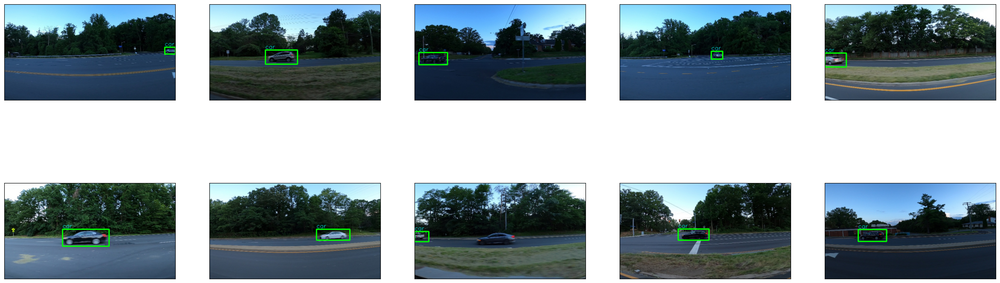

In [9]:
import random
import os
import cv2
import matplotlib.pyplot as plt
class_names = ["car"]
images_path = os.path.join("data", "images")
images = os.listdir(images_path)
images = random.sample(images, 10)

plt.figure(figsize=(30, 10))

for i, image_file in enumerate(images):
    plt.subplot(2, 5, i + 1)
    image = cv2.imread(os.path.join(images_path, image_file))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join("data", "labels", label_file)

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            labels = f.read().strip().split("\n")

        for label in labels:
            if len(label.split()) != 5:  # 5 değer kontrolü (class_id + 4 koordinat)
                continue

            class_id, x_center, y_center, box_w, box_h = map(float, label.split())
            x_min = int((x_center - box_w / 2) * image.shape[1])
            y_min = int((y_center - box_h / 2) * image.shape[0])
            x_max = int((x_center + box_w / 2) * image.shape[1])
            y_max = int((y_center + box_h / 2) * image.shape[0])

            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)

            text = f"{class_names[int(class_id)]}"
            text_scale = max(0.5, min(image.shape[1], image.shape[0]) / 500)
            text_thickness = max(1, int(text_scale * 2))
            cv2.putText(
                image,
                text,
                (x_min, max(y_min - 5, 0)),
                cv2.FONT_HERSHEY_SIMPLEX,
                text_scale,
                (0, 255, 255),
                text_thickness,
                cv2.LINE_AA,
            )

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

plt.show()


In [10]:
import splitfolders
def train_test_split_data(data_path):
    output_path = "prepared_data"
    splitfolders.ratio(data_path, output_path,ratio=(.8,.1,.1))

In [11]:
base_data_path = "data"
train_test_split_data(base_data_path)

Copying files: 710 files [00:00, 1969.47 files/s]


In [12]:
shutil.rmtree(base_data_path)

In [13]:
prepared_data_path = "prepared_data"
train_path = os.path.join("train","images")
test_path = os.path.join("test","images")
val_path = os.path.join("val","images")
nc = 1
class_names = ["car"]

In [14]:
import yaml
def prepare_yaml():
    data = {
    "train": "train",
    "val": "val",
    "test": "test",
    "nc": 1,
    "names": ["car"]
    }
    with open(os.path.join(prepared_data_path,"train.yaml"), "w+") as f:
        yaml.dump(data, f)


In [15]:
prepare_yaml()

In [16]:
model = YOLO("yolo11s.pt")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_runnin

In [54]:
train_yaml = os.path.join(prepared_data_path, "train.yaml")
model.train(data=train_yaml,epochs=100,imgsz=(416, 416))

Ultralytics 8.3.73  Python-3.12.4 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolo11s.pt, data=prepared_data\train.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=(416, 416), save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

train: Scanning C:\JetbrainsProjects\PythonProject\prepared_data\train\labels.cache... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<?, ?it/s]
val: Scanning C:\JetbrainsProjects\PythonProject\prepared_data\val\labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.02G      2.091      2.627      1.566         21        416: 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.24it/s]

                   all         35         35    0.00314      0.943      0.217      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.02G      1.302      1.342      1.203         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.66it/s]

                   all         35         35      0.968      0.314      0.699      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.03G      1.194      1.091      1.112         25        416: 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.29it/s]

                   all         35         35      0.715      0.743      0.809      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.03G      1.192       1.02      1.093         16        416: 100%|██████████| 18/18 [00:02<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.72it/s]

                   all         35         35      0.716      0.937      0.876       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.03G      1.186     0.9598      1.098         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.34it/s]

                   all         35         35      0.768      0.971      0.855      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.03G       1.17     0.9251      1.087         25        416: 100%|██████████| 18/18 [00:02<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.26it/s]

                   all         35         35       0.79      0.914      0.823      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.03G      1.176     0.9221      1.085         27        416: 100%|██████████| 18/18 [00:02<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.64it/s]

                   all         35         35       0.83      0.914      0.916      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.03G      1.121      0.852      1.064         19        416: 100%|██████████| 18/18 [00:02<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.25it/s]

                   all         35         35      0.792      0.982      0.905      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.03G      1.092     0.8489      1.048         18        416: 100%|██████████| 18/18 [00:02<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.69it/s]

                   all         35         35      0.886      0.914      0.912      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.03G      1.106      0.807      1.081         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.52it/s]

                   all         35         35      0.779      0.906        0.9      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.03G      1.182     0.7893      1.052         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.78it/s]

                   all         35         35      0.764      0.925       0.89      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.05G      1.162     0.8471      1.073         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.28it/s]

                   all         35         35      0.791          1       0.93      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.03G      1.138     0.8049      1.076         18        416: 100%|██████████| 18/18 [00:02<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.95it/s]

                   all         35         35      0.787      0.952      0.936      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.03G      1.135     0.7894      1.036         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.09it/s]

                   all         35         35      0.841      0.914      0.918      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.03G      1.113     0.8049      1.049         19        416: 100%|██████████| 18/18 [00:02<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.48it/s]

                   all         35         35      0.777      0.943      0.923      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.05G      1.115     0.7763      1.059         28        416: 100%|██████████| 18/18 [00:02<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.99it/s]

                   all         35         35      0.827      0.957      0.951      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.03G      1.122     0.8008      1.054         15        416: 100%|██████████| 18/18 [00:02<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.78it/s]

                   all         35         35      0.821      0.829      0.897      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.03G      1.113     0.7319      1.031         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.85it/s]

                   all         35         35      0.796      0.943      0.912      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.03G      1.068     0.7121      1.051         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.16it/s]

                   all         35         35      0.783       0.93        0.9      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.03G      1.083     0.7369      1.067         19        416: 100%|██████████| 18/18 [00:02<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.47it/s]

                   all         35         35      0.782      0.921       0.91      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.03G      1.076     0.7071      1.031         22        416: 100%|██████████| 18/18 [00:02<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.31it/s]

                   all         35         35      0.863      0.914      0.926       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.03G      1.039     0.6892       1.02         32        416: 100%|██████████| 18/18 [00:02<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.09it/s]

                   all         35         35      0.827          1      0.943      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.03G      1.035     0.6896      1.006         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.94it/s]

                   all         35         35      0.826      0.971      0.951      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.03G      1.059      0.704      1.037         27        416: 100%|██████████| 18/18 [00:02<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.67it/s]

                   all         35         35      0.813      0.991      0.949      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.03G      1.036     0.6588      1.031         28        416: 100%|██████████| 18/18 [00:02<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.69it/s]

                   all         35         35      0.862      0.857      0.917      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.03G      1.062     0.6618      1.033         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.48it/s]

                   all         35         35      0.776      0.992      0.934      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.03G      1.039     0.6572      1.027         26        416: 100%|██████████| 18/18 [00:02<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]

                   all         35         35      0.846      0.943      0.948      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.03G      1.056     0.6918       1.03         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.59it/s]

                   all         35         35      0.939      0.878      0.947      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.03G      1.043     0.6808      1.007         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.49it/s]

                   all         35         35       0.89      0.943      0.955      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.03G      1.014     0.6591      1.014         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.44it/s]

                   all         35         35      0.833      0.943      0.941      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.03G      1.027     0.6657       1.01         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.27it/s]

                   all         35         35      0.778      0.914      0.914      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.05G       0.99     0.6358     0.9911         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.68it/s]

                   all         35         35      0.883      0.886      0.952      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.03G      1.051     0.6724      1.033         25        416: 100%|██████████| 18/18 [00:02<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.84it/s]

                   all         35         35      0.894      0.857      0.956      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.03G      1.026     0.6653      1.019         12        416: 100%|██████████| 18/18 [00:02<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.65it/s]

                   all         35         35      0.735      0.871      0.904       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.03G     0.9989     0.6535      1.003         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.44it/s]

                   all         35         35      0.772      0.968      0.921       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.03G      1.007     0.6441      1.001         16        416: 100%|██████████| 18/18 [00:02<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.90it/s]

                   all         35         35      0.843      0.886       0.93      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.03G      1.007     0.6226       1.01         19        416: 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.39it/s]

                   all         35         35      0.873      0.985      0.973      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.05G     0.9778     0.6105     0.9866         26        416: 100%|██████████| 18/18 [00:02<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]

                   all         35         35      0.791      0.886      0.899      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.03G     0.9635     0.6145      1.008         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.66it/s]

                   all         35         35      0.843          1      0.945      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.03G      1.006     0.5862      1.013         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.05it/s]

                   all         35         35      0.802      0.943      0.938      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.03G     0.9611     0.6026     0.9997         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.55it/s]

                   all         35         35      0.813      0.993      0.953      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.03G      1.004     0.6212      1.019         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.80it/s]

                   all         35         35      0.831          1      0.958      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.03G     0.9494     0.5789     0.9827         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.33it/s]

                   all         35         35      0.894      0.963      0.963      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.03G     0.9496     0.5874          1         26        416: 100%|██████████| 18/18 [00:02<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.19it/s]

                   all         35         35      0.981        0.8      0.947      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.03G     0.9804     0.5781     0.9959         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.47it/s]

                   all         35         35      0.786      0.971      0.925      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.03G     0.9452     0.5593     0.9961         18        416: 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.09it/s]

                   all         35         35      0.829      0.968      0.945      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.03G     0.9605     0.5721     0.9939         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.42it/s]

                   all         35         35      0.833      0.994      0.971      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.03G     0.9464     0.5735      0.984         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.62it/s]

                   all         35         35      0.798      0.971       0.95      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.03G       0.97     0.5827     0.9966         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.35it/s]

                   all         35         35      0.856      0.886      0.941      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.03G     0.9451     0.5346     0.9839         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.11it/s]

                   all         35         35      0.834      0.943      0.942       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.03G      0.932     0.5652     0.9799         17        416: 100%|██████████| 18/18 [00:02<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]

                   all         35         35      0.826      0.971      0.951      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.05G     0.9352     0.5594     0.9702         31        416: 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.57it/s]

                   all         35         35      0.833      0.943      0.946      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.03G     0.9337     0.5556     0.9806         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.42it/s]

                   all         35         35      0.859      0.943      0.948      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.03G     0.8958     0.5326     0.9829         18        416: 100%|██████████| 18/18 [00:02<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.68it/s]

                   all         35         35      0.881      0.943      0.965      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.03G     0.9216      0.549     0.9709         29        416: 100%|██████████| 18/18 [00:02<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.68it/s]

                   all         35         35      0.878      0.886       0.95      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.03G     0.8731     0.5583     0.9616         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]

                   all         35         35      0.853      0.886      0.959      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.03G     0.9283     0.5658      0.977         25        416: 100%|██████████| 18/18 [00:02<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.86it/s]

                   all         35         35      0.967      0.848      0.965      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.05G     0.9219      0.544     0.9887         28        416: 100%|██████████| 18/18 [00:02<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.54it/s]

                   all         35         35      0.838      0.943      0.959      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.03G     0.9118     0.5355     0.9449         28        416: 100%|██████████| 18/18 [00:02<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]

                   all         35         35      0.824      0.939      0.948       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.05G     0.9267     0.5362      0.973         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.96it/s]

                   all         35         35      0.914      0.912       0.96      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.03G     0.9457     0.5312     0.9648         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.76it/s]

                   all         35         35      0.825          1      0.957      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.05G      0.916     0.5264     0.9632         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]

                   all         35         35      0.881          1      0.956      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.03G     0.8942     0.5175     0.9652         20        416: 100%|██████████| 18/18 [00:02<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.02it/s]

                   all         35         35      0.864      0.971      0.949      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.03G     0.9039      0.516     0.9479         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.78it/s]

                   all         35         35      0.832      0.988      0.966      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.03G     0.8651     0.5023     0.9547         26        416: 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.31it/s]

                   all         35         35      0.845      0.943      0.958      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.03G     0.8993     0.5214     0.9566         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.02it/s]

                   all         35         35      0.777      0.886      0.912      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.03G     0.8745      0.498      0.968         25        416: 100%|██████████| 18/18 [00:02<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.74it/s]

                   all         35         35      0.793      0.971      0.924      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.05G     0.8752     0.5231     0.9566         17        416: 100%|██████████| 18/18 [00:02<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.11it/s]

                   all         35         35       0.78      0.971      0.922      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.03G     0.8418     0.4921      0.965         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.75it/s]

                   all         35         35       0.85      0.969      0.941      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.03G     0.8801     0.5156     0.9586         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.79it/s]

                   all         35         35      0.885      0.878      0.945      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.03G     0.8502     0.5109      0.949         29        416: 100%|██████████| 18/18 [00:02<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.33it/s]

                   all         35         35      0.869      0.971      0.928      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.05G     0.8517     0.4966     0.9578         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.98it/s]

                   all         35         35      0.959      0.714       0.92      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.03G     0.8706     0.5091     0.9409         27        416: 100%|██████████| 18/18 [00:02<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.47it/s]

                   all         35         35      0.833      0.857      0.938      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.03G     0.8674     0.5022     0.9548         22        416: 100%|██████████| 18/18 [00:02<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.09it/s]

                   all         35         35      0.843      0.914      0.953      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.03G     0.8452     0.4866      0.946         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.71it/s]

                   all         35         35      0.916      0.829       0.96      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.05G     0.8486     0.4875     0.9439         29        416: 100%|██████████| 18/18 [00:02<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.90it/s]

                   all         35         35      0.857      0.855      0.941      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.01G     0.8233     0.4914     0.9383         13        416: 100%|██████████| 18/18 [00:02<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.75it/s]

                   all         35         35      0.854      0.857      0.938      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.03G     0.8388     0.4704     0.9391         21        416: 100%|██████████| 18/18 [00:02<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.42it/s]

                   all         35         35      0.838      0.885      0.922      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.03G     0.8217     0.4775     0.9414         18        416: 100%|██████████| 18/18 [00:02<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.56it/s]

                   all         35         35      0.832      0.886       0.93      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.04G     0.8076     0.4742     0.9368         23        416: 100%|██████████| 18/18 [00:02<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.83it/s]

                   all         35         35      0.858      0.886      0.951      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.03G     0.7983     0.4777      0.933         22        416: 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.63it/s]

                   all         35         35      0.867      0.943      0.955      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.03G     0.8044      0.495     0.9395         16        416: 100%|██████████| 18/18 [00:02<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.58it/s]

                   all         35         35      0.851      0.981      0.955      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.03G     0.7984     0.4714     0.9227         17        416: 100%|██████████| 18/18 [00:02<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.49it/s]

                   all         35         35      0.868      0.943      0.948      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.05G     0.8218     0.4631     0.9337         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.33it/s]

                   all         35         35      0.849      0.965      0.949      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.01G     0.7981     0.4499     0.9498         14        416: 100%|██████████| 18/18 [00:02<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.14it/s]

                   all         35         35      0.845      0.935      0.949      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.05G      0.802     0.4627      0.937         16        416: 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.76it/s]

                   all         35         35      0.844      0.931      0.958      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.03G     0.7786     0.4563     0.9253         24        416: 100%|██████████| 18/18 [00:02<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]

                   all         35         35      0.832      0.992      0.959      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.05G     0.8055      0.449     0.9302         28        416: 100%|██████████| 18/18 [00:02<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.94it/s]

                   all         35         35      0.867      0.933      0.953      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.03G     0.7954     0.4578     0.9214         30        416: 100%|██████████| 18/18 [00:02<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.26it/s]

                   all         35         35      0.891      0.933      0.956      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.03G     0.7949     0.4528     0.9348         19        416: 100%|██████████| 18/18 [00:02<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.28it/s]

                   all         35         35       0.87      0.953      0.964      0.664


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.03G     0.7917     0.4653      0.947         10        416: 100%|██████████| 18/18 [00:02<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.49it/s]

                   all         35         35      0.832      0.993      0.962      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.03G     0.7869     0.4526     0.9384          9        416: 100%|██████████| 18/18 [00:02<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.33it/s]

                   all         35         35      0.829       0.97      0.956      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.03G     0.8026     0.4391     0.9482         10        416: 100%|██████████| 18/18 [00:02<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.34it/s]

                   all         35         35      0.828      0.971      0.953       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.04G     0.7606     0.4255     0.9208         10        416: 100%|██████████| 18/18 [00:02<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.72it/s]

                   all         35         35      0.794      0.943      0.949       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.03G      0.718     0.4007     0.9119         11        416: 100%|██████████| 18/18 [00:02<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.88it/s]

                   all         35         35        0.8      0.943      0.943      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.03G     0.7439      0.413     0.9278         11        416: 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.44it/s]

                   all         35         35      0.813      0.914      0.947      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.03G     0.7602     0.4235     0.9534         10        416: 100%|██████████| 18/18 [00:02<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.51it/s]

                   all         35         35      0.835      0.943      0.954      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.03G     0.7722     0.4067     0.9354         11        416: 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.71it/s]

                   all         35         35       0.81      0.943      0.954      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.03G     0.7379     0.4095     0.9312         10        416: 100%|██████████| 18/18 [00:02<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.79it/s]

                   all         35         35      0.807      0.954      0.951      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.05G     0.7425     0.4017     0.9211         11        416: 100%|██████████| 18/18 [00:02<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.69it/s]

                   all         35         35      0.804      0.971      0.952      0.648



100 epochs completed in 0.113 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 19.1MB
Optimizer stripped from runs\detect\train\weights\best.pt, 19.1MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.73  Python-3.12.4 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.36it/s]


                   all         35         35      0.833      0.995      0.971      0.678
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs\detect\train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001A8C0F3FBF0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [55]:
from PIL import Image
detect_train_path = os.path.join("runs/detect/train")

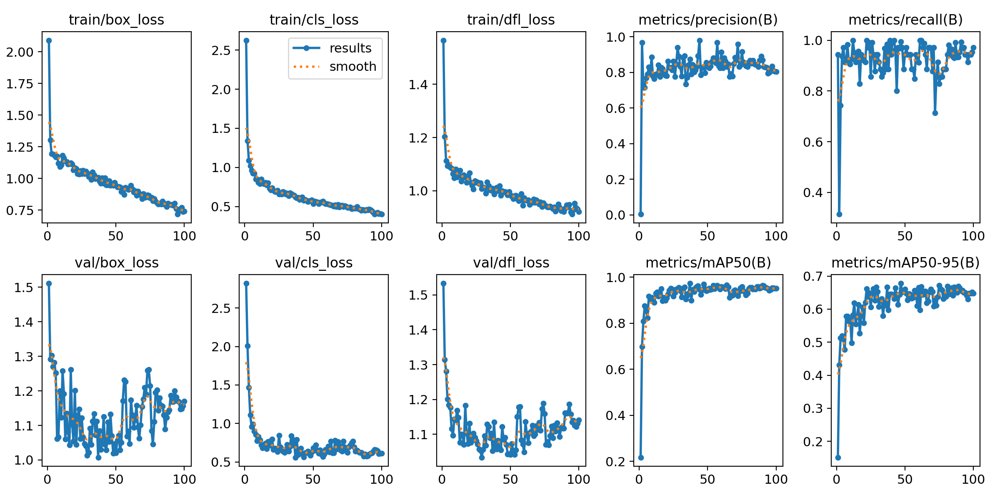

In [56]:
Image.open(os.path.join(detect_train_path,"results.png")).convert("RGB")

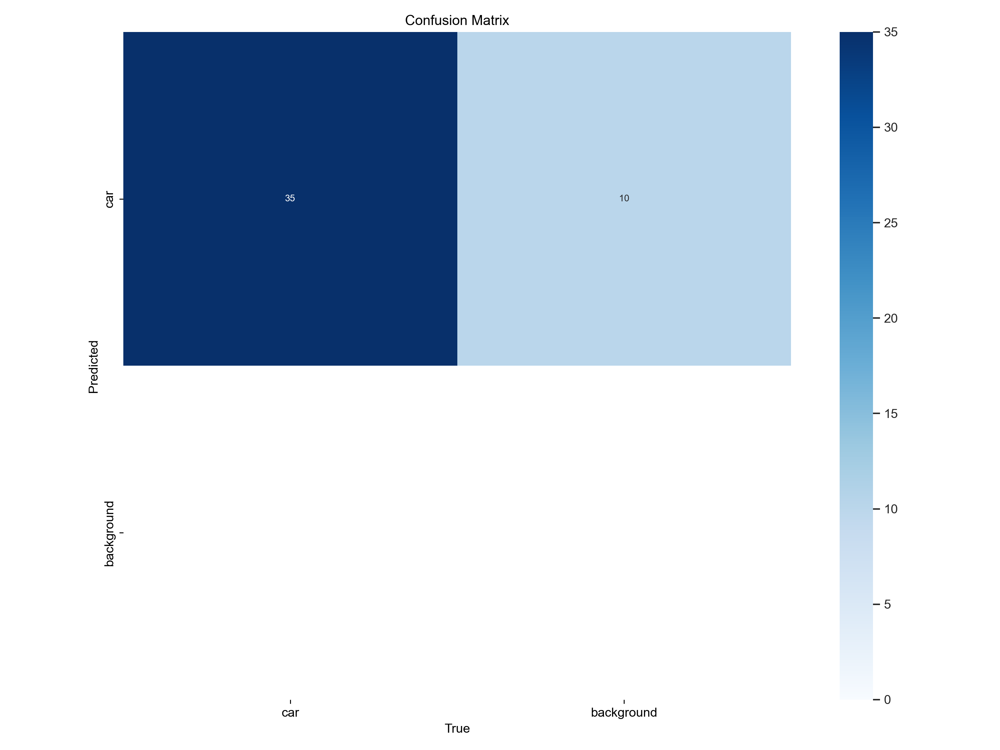

In [57]:
Image.open(os.path.join(detect_train_path,"confusion_matrix.png")).convert("RGB")

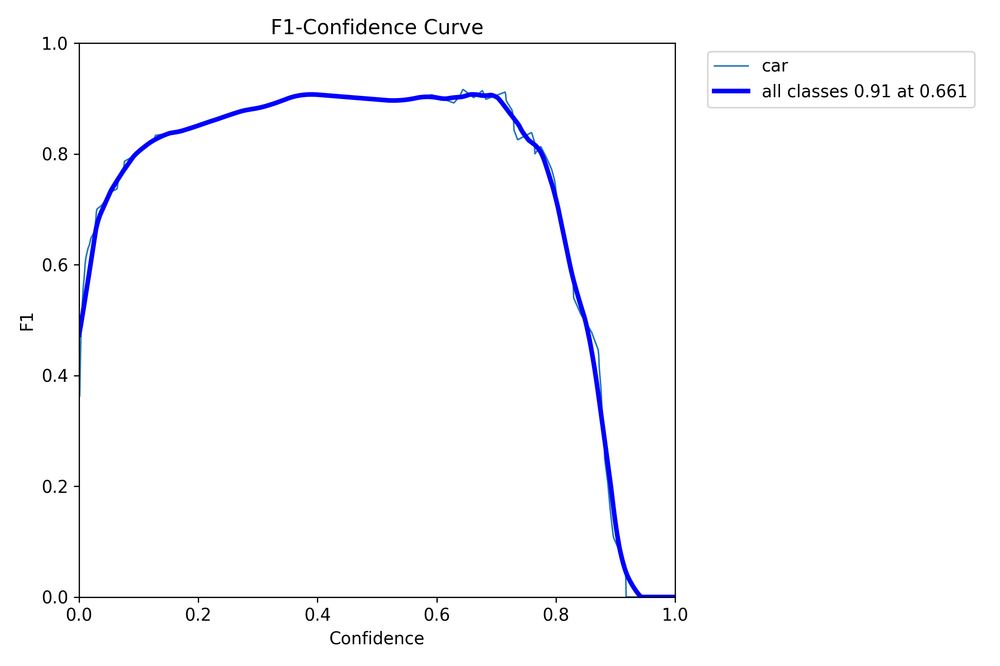

In [58]:
Image.open(os.path.join(detect_train_path,"F1_curve.png")).convert("RGB")

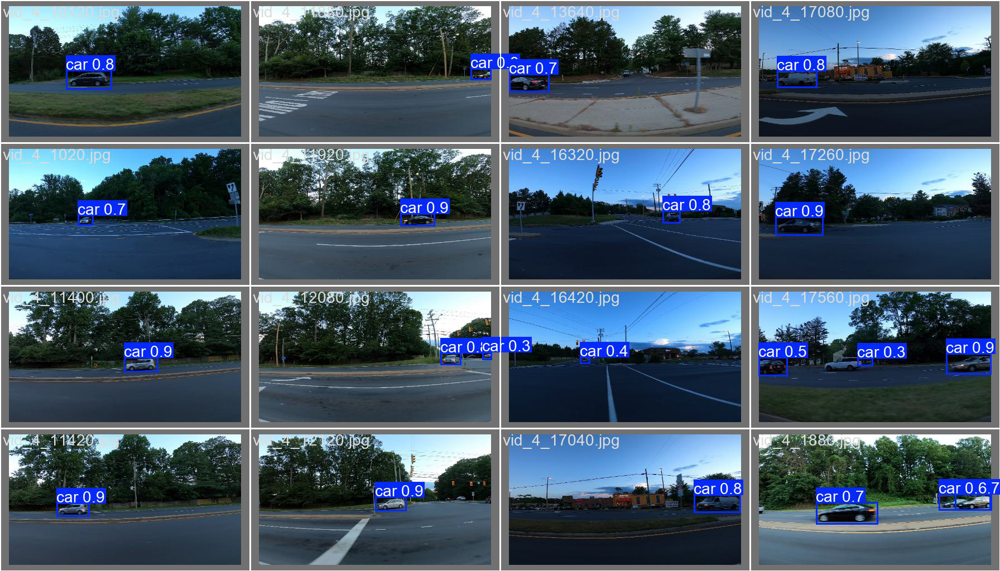

In [59]:
Image.open(os.path.join(detect_train_path,"val_batch0_pred.jpg")).convert("RGB")


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_1040.jpg: 256x416 1 car, 29.7ms
Speed: 2.0ms preprocess, 29.7ms inference, 3.2ms postprocess per image at shape (1, 3, 256, 416)


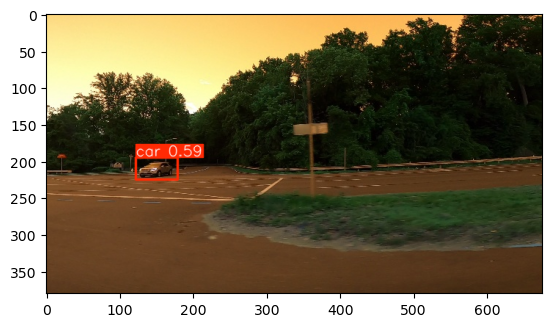


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_12060.jpg: 256x416 1 car, 20.7ms
Speed: 1.0ms preprocess, 20.7ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


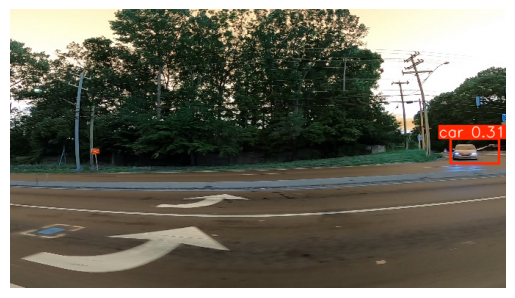


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_13680.jpg: 256x416 2 cars, 19.0ms
Speed: 1.0ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


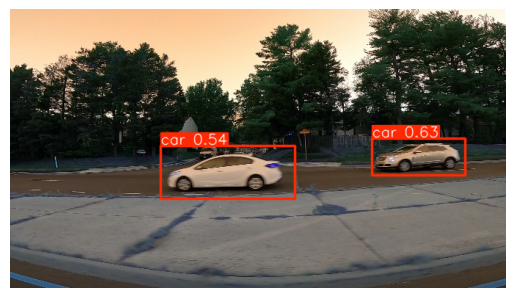


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_13780.jpg: 256x416 2 cars, 25.1ms
Speed: 2.0ms preprocess, 25.1ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 416)


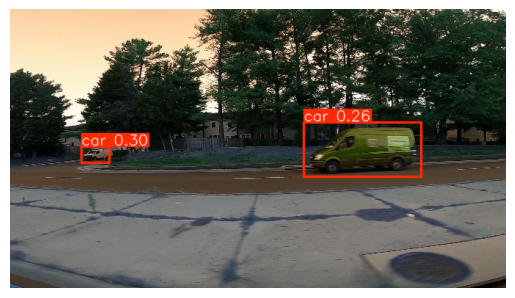


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_16060.jpg: 256x416 1 car, 25.0ms
Speed: 1.5ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


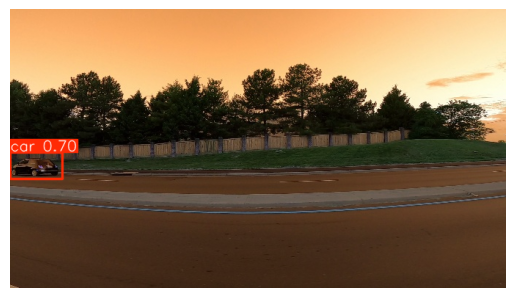


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_16140.jpg: 256x416 1 car, 25.7ms
Speed: 1.0ms preprocess, 25.7ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 416)


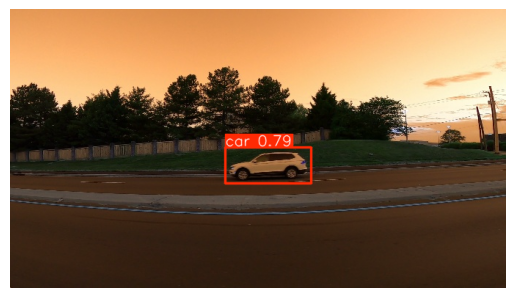


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_17120.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 416)


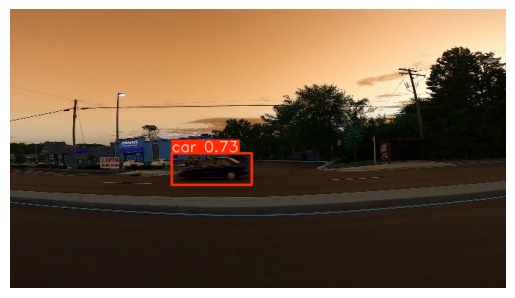


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_1800.jpg: 256x416 3 cars, 24.0ms
Speed: 2.1ms preprocess, 24.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


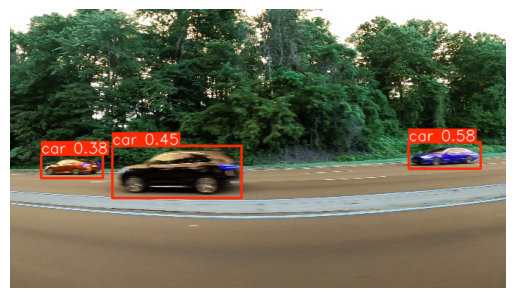


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2060.jpg: 256x416 3 cars, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


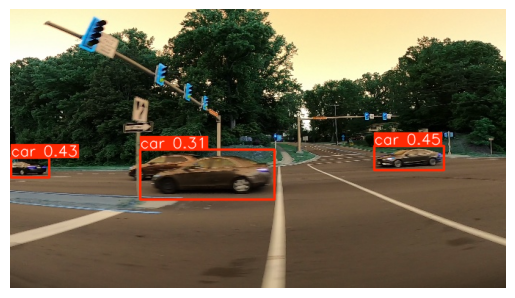


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2100.jpg: 256x416 3 cars, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


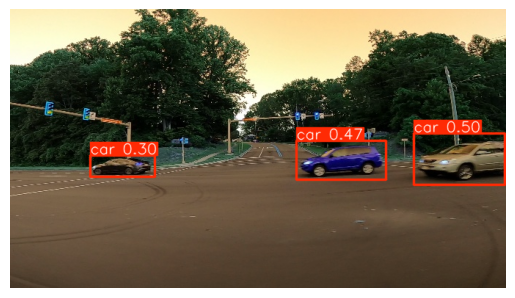


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_21160.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


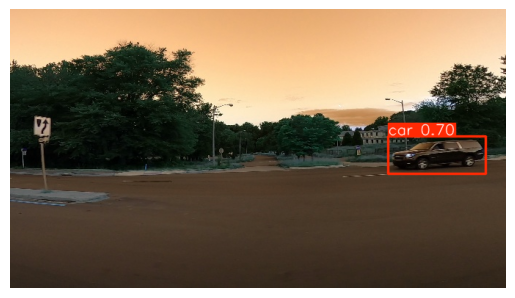


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2140.jpg: 256x416 (no detections), 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 416)


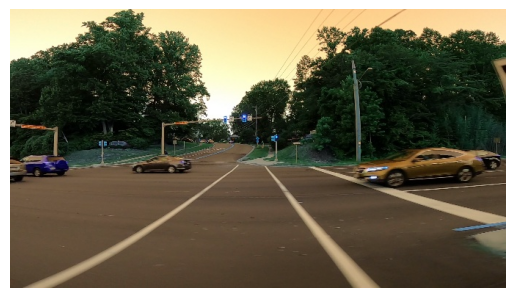


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_21560.jpg: 256x416 2 cars, 24.1ms
Speed: 2.0ms preprocess, 24.1ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


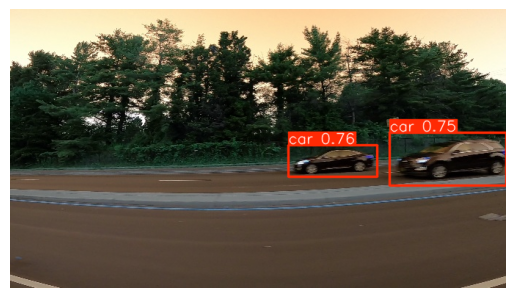


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2160.jpg: 256x416 2 cars, 24.4ms
Speed: 2.0ms preprocess, 24.4ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 416)


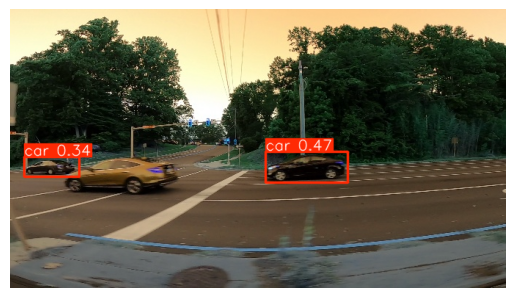


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_21660.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 416)


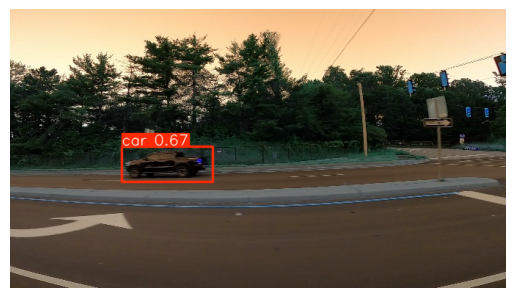


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2180.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


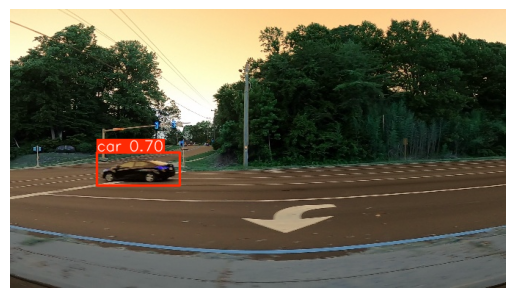


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2200.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


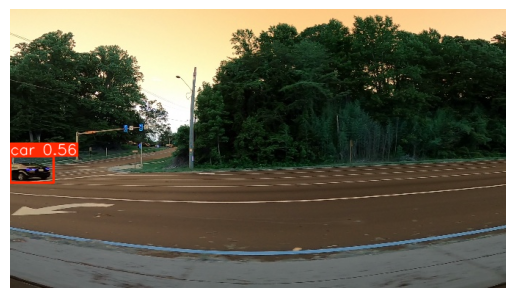


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_22720.jpg: 256x416 1 car, 25.6ms
Speed: 0.5ms preprocess, 25.6ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 416)


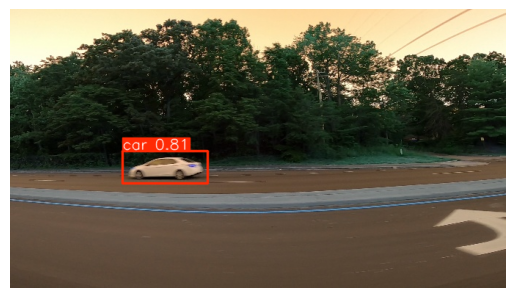


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_23020.jpg: 256x416 1 car, 24.0ms
Speed: 2.0ms preprocess, 24.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


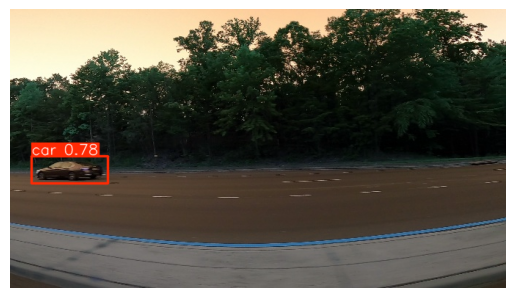


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_24760.jpg: 256x416 1 car, 24.0ms
Speed: 2.0ms preprocess, 24.0ms inference, 2.9ms postprocess per image at shape (1, 3, 256, 416)


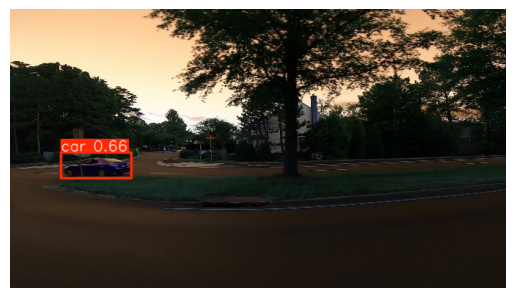


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_2540.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 416)


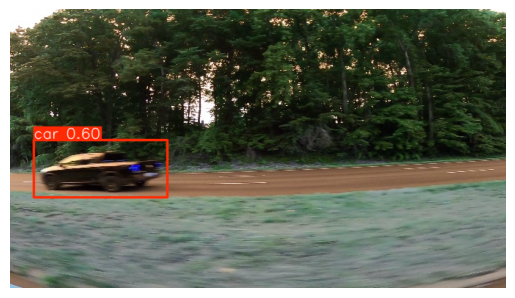


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_26500.jpg: 256x416 3 cars, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


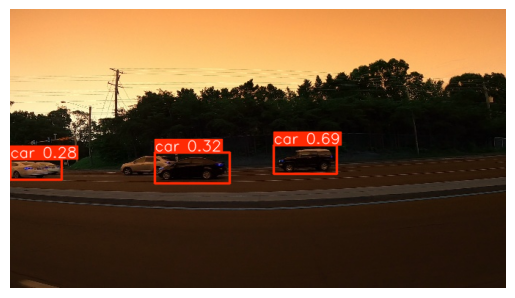


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_29540.jpg: 256x416 1 car, 25.0ms
Speed: 2.0ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


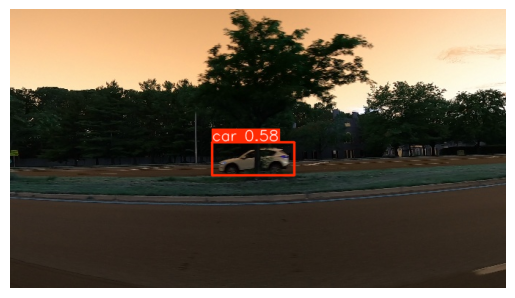


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_29560.jpg: 256x416 1 car, 25.0ms
Speed: 1.6ms preprocess, 25.0ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


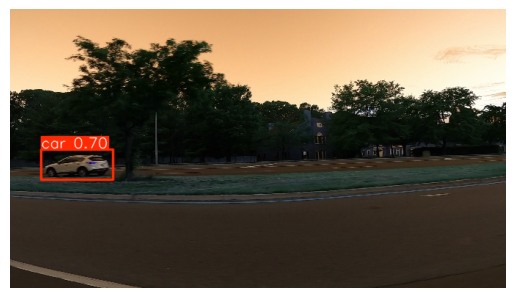


image 1/1 C:\JetbrainsProjects\PythonProject\prepared_data\test\images\vid_4_3520.jpg: 256x416 1 car, 25.5ms
Speed: 1.6ms preprocess, 25.5ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 416)


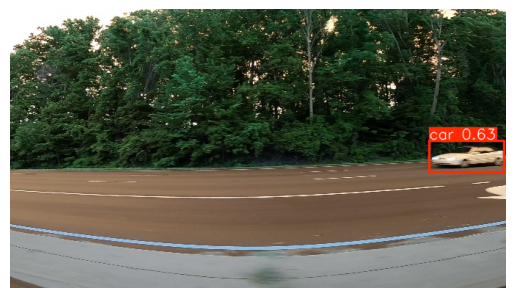

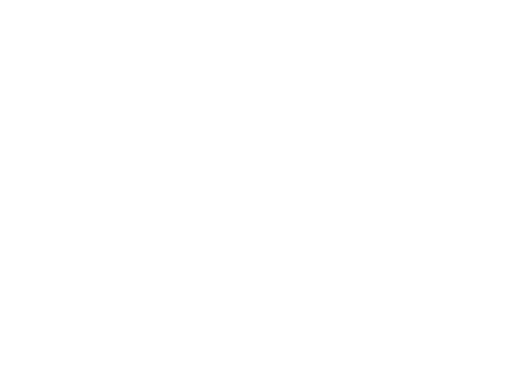

In [60]:
test_images_path = os.path.join(prepared_data_path,"test","images")
image_files = os.listdir(test_images_path)[:25]

for img_name in image_files:
    img_path = os.path.join(test_images_path, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for result in results:
        plot_img = result.plot()
        plt.imshow(plot_img,cmap="gray")
        plt.show()
        plt.axis('off')